# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [17]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

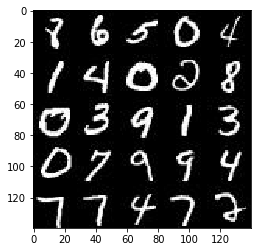

In [18]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

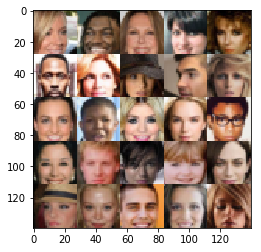

In [19]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [20]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/Users/zhangtianyi/anaconda/envs/tensorflow1.0/lib/python3.5/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [29]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input_images = tf.placeholder(tf.float32,(None,image_width, image_height, image_channels),name='input_real')
    z_input = tf.placeholder(tf.float32,(None,z_dim),name='input_z')
    learning_rate = tf.placeholder(tf.float32,(None))
    return real_input_images, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [30]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x1 = tf.layers.conv2d(images, 64, 4, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 4, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
    
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        

        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [31]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    alpha = 0.2
    reuse = not is_train
    with tf.variable_scope('generator', reuse= reuse):
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)

        x3 = tf.layers.conv2d_transpose(x2, 128, 4, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 4, strides=2, padding='same')

        out = tf.tanh(logits)
        
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [32]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [37]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]
    # Optimize
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [38]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [35]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    inputs_real, inputs_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, betal)
    step = 0 
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={inputs_z: batch_z, lr:learning_rate})
                
                if step % 100 == 0:
                    train_loss_d = d_loss.eval({inputs_z:batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z:batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, step),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))    

                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2 Step 100... Discriminator Loss: 0.4644... Generator Loss: 2.7775


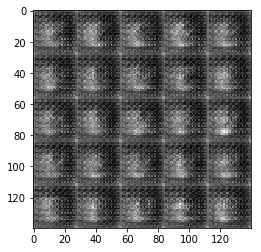

Epoch 1/2 Step 200... Discriminator Loss: 1.4854... Generator Loss: 1.8842


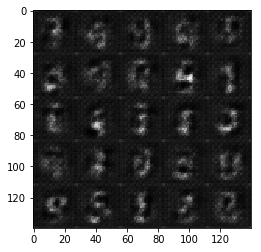

Epoch 1/2 Step 300... Discriminator Loss: 0.9954... Generator Loss: 1.0625


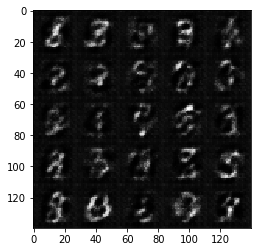

Epoch 1/2 Step 400... Discriminator Loss: 0.8681... Generator Loss: 1.4697


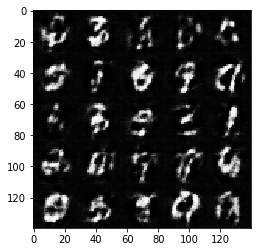

Epoch 1/2 Step 500... Discriminator Loss: 0.9129... Generator Loss: 1.4483


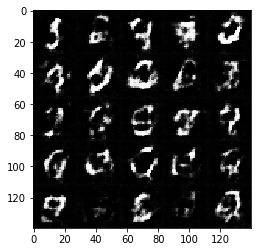

Epoch 1/2 Step 600... Discriminator Loss: 1.1068... Generator Loss: 0.7389


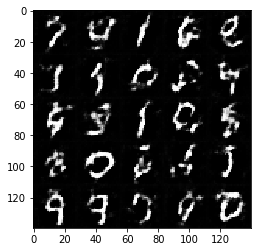

Epoch 1/2 Step 700... Discriminator Loss: 1.1057... Generator Loss: 0.7929


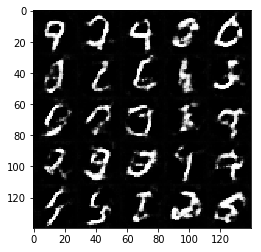

Epoch 1/2 Step 800... Discriminator Loss: 0.9198... Generator Loss: 0.9907


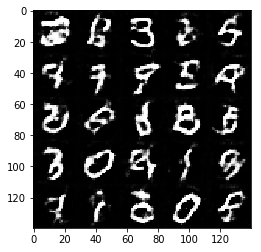

Epoch 1/2 Step 900... Discriminator Loss: 1.4629... Generator Loss: 2.4647


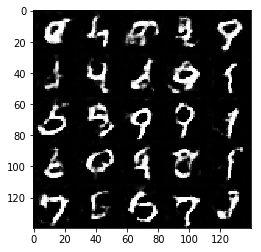

Epoch 1/2 Step 1000... Discriminator Loss: 1.1468... Generator Loss: 0.6778


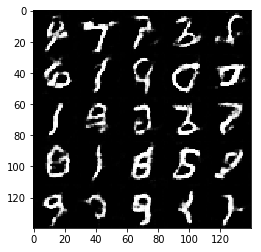

Epoch 1/2 Step 1100... Discriminator Loss: 1.5666... Generator Loss: 0.4357


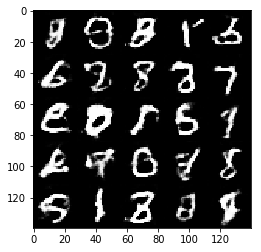

Epoch 1/2 Step 1200... Discriminator Loss: 0.8497... Generator Loss: 1.1125


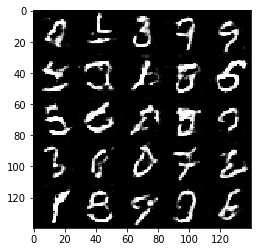

Epoch 1/2 Step 1300... Discriminator Loss: 1.5505... Generator Loss: 0.4138


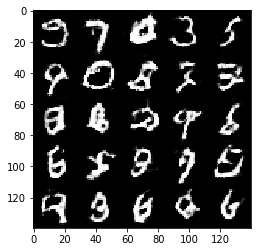

Epoch 1/2 Step 1400... Discriminator Loss: 0.7811... Generator Loss: 1.1892


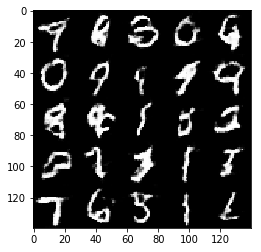

Epoch 1/2 Step 1500... Discriminator Loss: 0.8238... Generator Loss: 1.1319


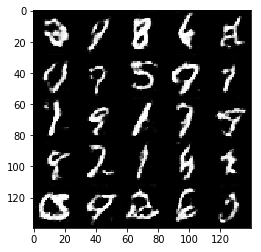

Epoch 2/2 Step 1600... Discriminator Loss: 0.8579... Generator Loss: 1.0944


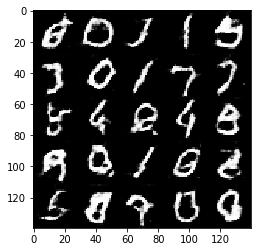

Epoch 2/2 Step 1700... Discriminator Loss: 0.8671... Generator Loss: 0.9999


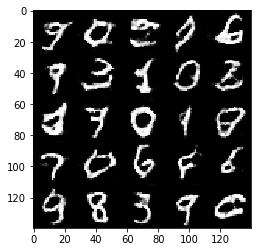

Epoch 2/2 Step 1800... Discriminator Loss: 0.7705... Generator Loss: 1.4470


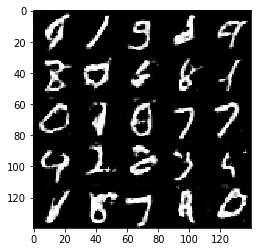

Epoch 2/2 Step 1900... Discriminator Loss: 0.7186... Generator Loss: 1.4887


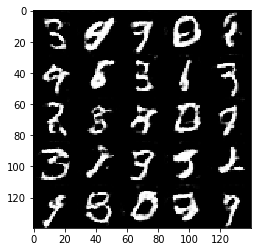

Epoch 2/2 Step 2000... Discriminator Loss: 0.7564... Generator Loss: 1.1724


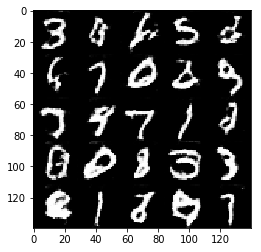

Epoch 2/2 Step 2100... Discriminator Loss: 1.1918... Generator Loss: 0.7428


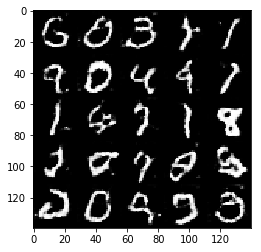

Epoch 2/2 Step 2200... Discriminator Loss: 0.7287... Generator Loss: 1.3342


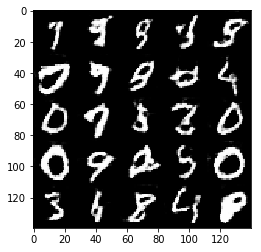

Epoch 2/2 Step 2300... Discriminator Loss: 0.6552... Generator Loss: 1.4029


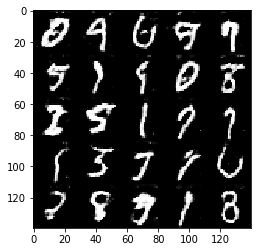

Epoch 2/2 Step 2400... Discriminator Loss: 0.5816... Generator Loss: 1.8949


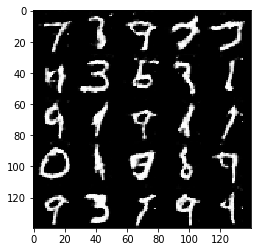

Epoch 2/2 Step 2500... Discriminator Loss: 0.7691... Generator Loss: 1.2057


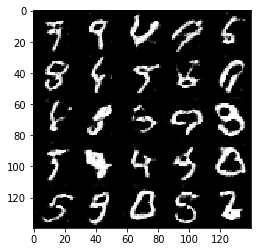

Epoch 2/2 Step 2600... Discriminator Loss: 0.5880... Generator Loss: 1.8525


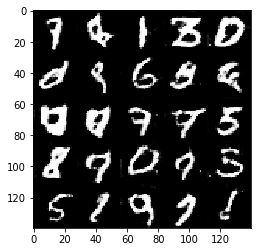

Epoch 2/2 Step 2700... Discriminator Loss: 0.8949... Generator Loss: 1.0002


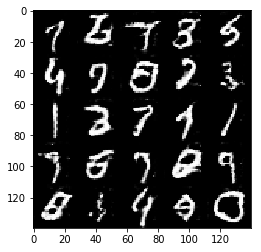

Epoch 2/2 Step 2800... Discriminator Loss: 1.0215... Generator Loss: 0.8122


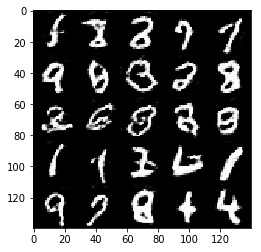

Epoch 2/2 Step 2900... Discriminator Loss: 1.2629... Generator Loss: 0.6721


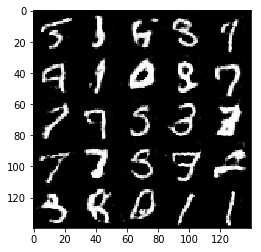

Epoch 2/2 Step 3000... Discriminator Loss: 0.6306... Generator Loss: 1.8336


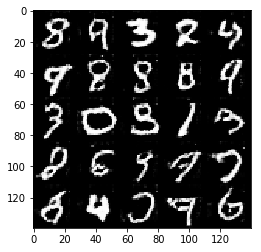

In [40]:
batch_size = 40
z_dim = 100
learning_rate = 0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1 Step 100... Discriminator Loss: 0.6567... Generator Loss: 1.7884


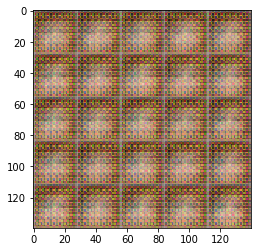

Epoch 1/1 Step 200... Discriminator Loss: 0.4687... Generator Loss: 2.5672


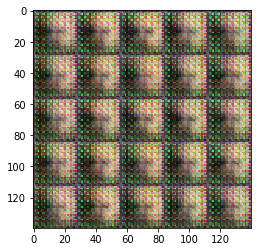

Epoch 1/1 Step 300... Discriminator Loss: 0.4276... Generator Loss: 2.7812


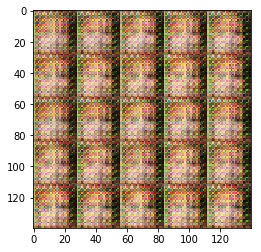

Epoch 1/1 Step 400... Discriminator Loss: 0.6644... Generator Loss: 1.8955


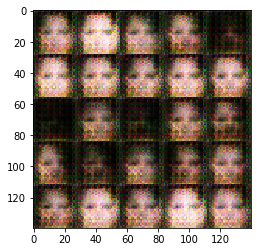

Epoch 1/1 Step 500... Discriminator Loss: 1.0004... Generator Loss: 1.0194


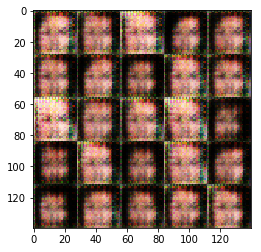

Epoch 1/1 Step 600... Discriminator Loss: 0.8971... Generator Loss: 1.6288


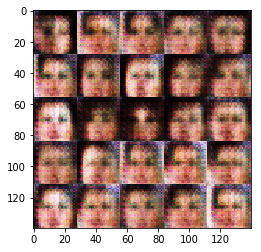

Epoch 1/1 Step 700... Discriminator Loss: 1.2077... Generator Loss: 0.6826


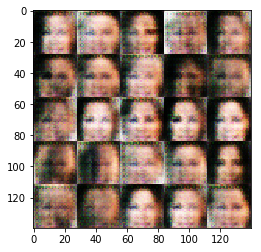

Epoch 1/1 Step 800... Discriminator Loss: 1.3401... Generator Loss: 1.2106


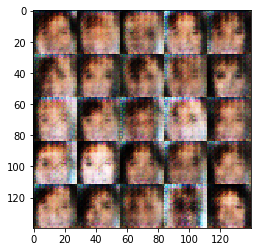

Epoch 1/1 Step 900... Discriminator Loss: 1.0627... Generator Loss: 0.8045


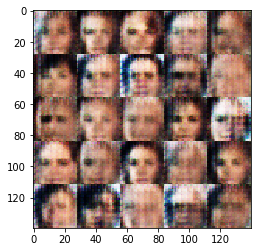

Epoch 1/1 Step 1000... Discriminator Loss: 1.0669... Generator Loss: 1.1837


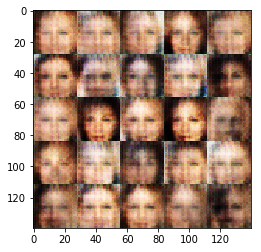

Epoch 1/1 Step 1100... Discriminator Loss: 1.3203... Generator Loss: 0.8514


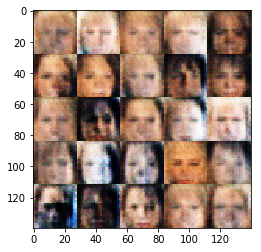

Epoch 1/1 Step 1200... Discriminator Loss: 1.3000... Generator Loss: 0.8938


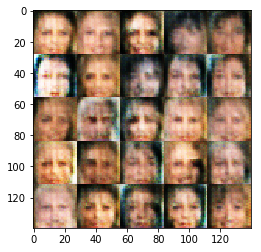

Epoch 1/1 Step 1300... Discriminator Loss: 1.2650... Generator Loss: 0.8066


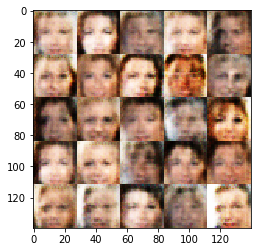

Epoch 1/1 Step 1400... Discriminator Loss: 1.3899... Generator Loss: 0.7526


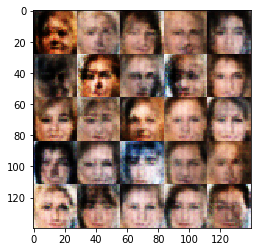

Epoch 1/1 Step 1500... Discriminator Loss: 1.0655... Generator Loss: 0.9571


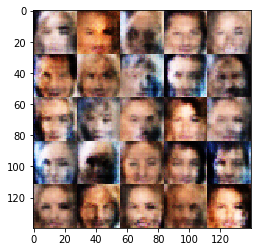

Epoch 1/1 Step 1600... Discriminator Loss: 1.1176... Generator Loss: 0.8212


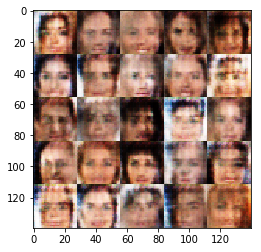

Epoch 1/1 Step 1700... Discriminator Loss: 1.2923... Generator Loss: 0.7752


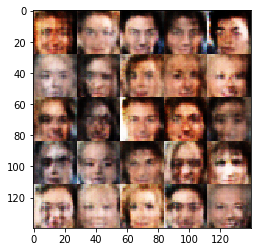

Epoch 1/1 Step 1800... Discriminator Loss: 1.3968... Generator Loss: 0.8986


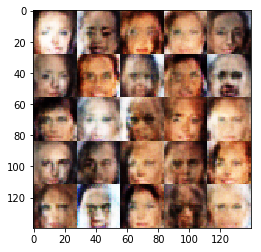

Epoch 1/1 Step 1900... Discriminator Loss: 1.2550... Generator Loss: 0.7687


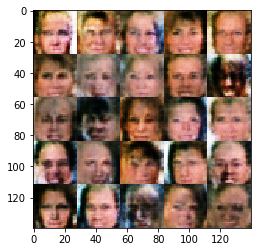

Epoch 1/1 Step 2000... Discriminator Loss: 1.1503... Generator Loss: 0.9303


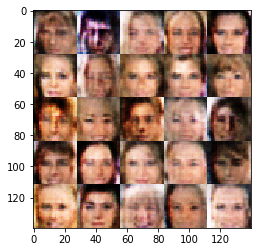

Epoch 1/1 Step 2100... Discriminator Loss: 1.0470... Generator Loss: 1.1948


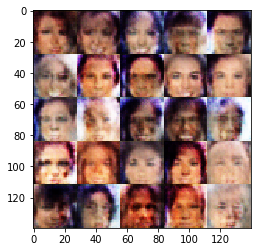

Epoch 1/1 Step 2200... Discriminator Loss: 1.3394... Generator Loss: 0.6821


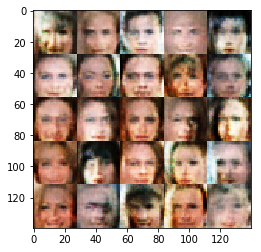

Epoch 1/1 Step 2300... Discriminator Loss: 1.1973... Generator Loss: 0.7337


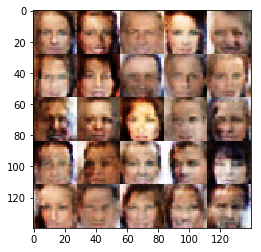

Epoch 1/1 Step 2400... Discriminator Loss: 1.0199... Generator Loss: 1.0468


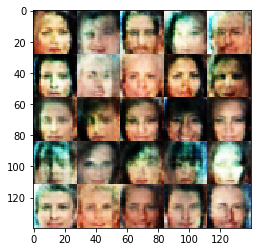

Epoch 1/1 Step 2500... Discriminator Loss: 1.3655... Generator Loss: 0.9463


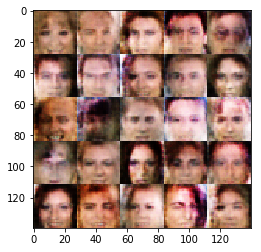

Epoch 1/1 Step 2600... Discriminator Loss: 1.1137... Generator Loss: 0.9772


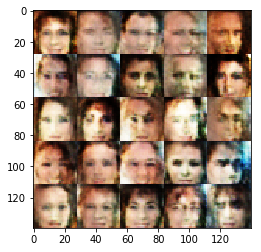

Epoch 1/1 Step 2700... Discriminator Loss: 1.1572... Generator Loss: 1.1754


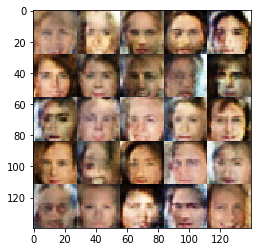

Epoch 1/1 Step 2800... Discriminator Loss: 1.0807... Generator Loss: 1.0015


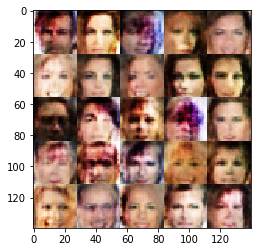

Epoch 1/1 Step 2900... Discriminator Loss: 1.1687... Generator Loss: 0.7984


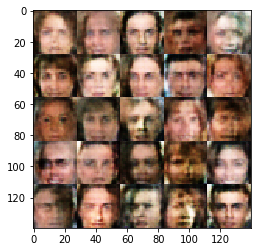

Epoch 1/1 Step 3000... Discriminator Loss: 1.1447... Generator Loss: 0.8231


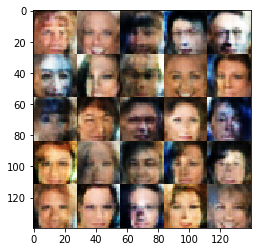

Epoch 1/1 Step 3100... Discriminator Loss: 1.3415... Generator Loss: 0.5939


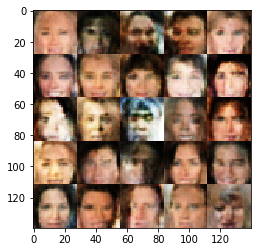

Epoch 1/1 Step 3200... Discriminator Loss: 1.3117... Generator Loss: 0.6509


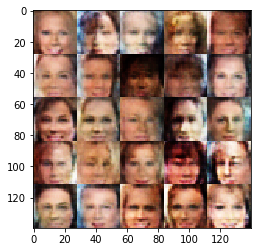

Epoch 1/1 Step 3300... Discriminator Loss: 1.3049... Generator Loss: 0.7064


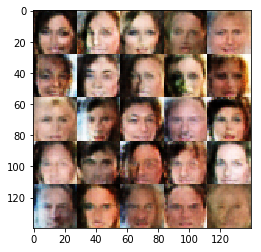

Epoch 1/1 Step 3400... Discriminator Loss: 1.0863... Generator Loss: 0.8182


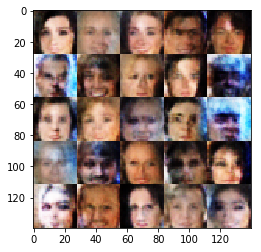

Epoch 1/1 Step 3500... Discriminator Loss: 1.0273... Generator Loss: 1.0677


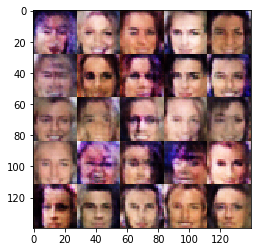

Epoch 1/1 Step 3600... Discriminator Loss: 1.3025... Generator Loss: 0.6904


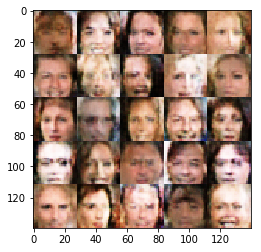

Epoch 1/1 Step 3700... Discriminator Loss: 1.2166... Generator Loss: 0.7056


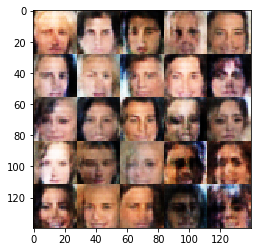

Epoch 1/1 Step 3800... Discriminator Loss: 1.4260... Generator Loss: 0.7656


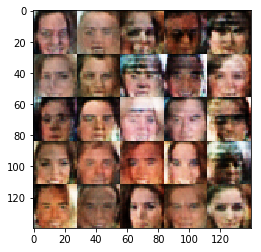

Epoch 1/1 Step 3900... Discriminator Loss: 1.2160... Generator Loss: 0.7189


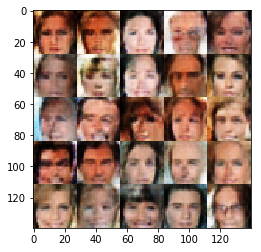

Epoch 1/1 Step 4000... Discriminator Loss: 1.4124... Generator Loss: 0.6902


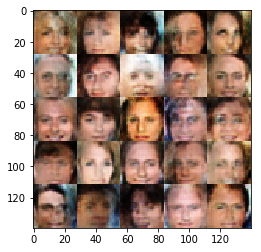

Epoch 1/1 Step 4100... Discriminator Loss: 1.2649... Generator Loss: 0.7905


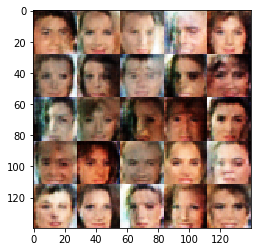

Epoch 1/1 Step 4200... Discriminator Loss: 1.3044... Generator Loss: 0.6775


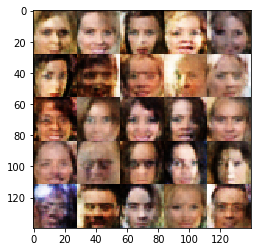

Epoch 1/1 Step 4300... Discriminator Loss: 1.0722... Generator Loss: 0.8964


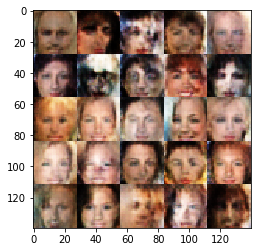

Epoch 1/1 Step 4400... Discriminator Loss: 1.3208... Generator Loss: 0.6828


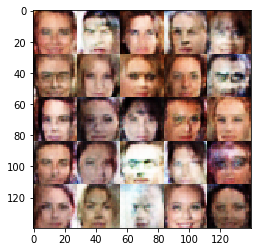

Epoch 1/1 Step 4500... Discriminator Loss: 1.1578... Generator Loss: 0.7032


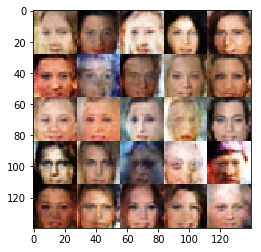

Epoch 1/1 Step 4600... Discriminator Loss: 0.9444... Generator Loss: 0.9583


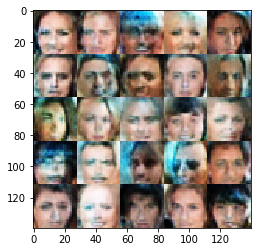

Epoch 1/1 Step 4700... Discriminator Loss: 1.1790... Generator Loss: 0.9174


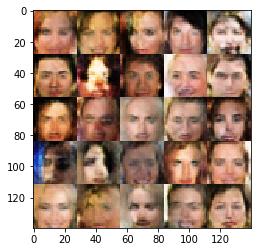

Epoch 1/1 Step 4800... Discriminator Loss: 1.1340... Generator Loss: 0.9992


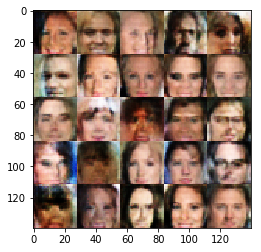

Epoch 1/1 Step 4900... Discriminator Loss: 1.1585... Generator Loss: 0.7972


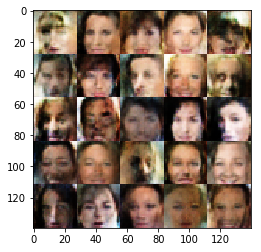

Epoch 1/1 Step 5000... Discriminator Loss: 1.1492... Generator Loss: 0.9114


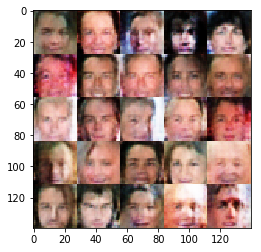

Epoch 1/1 Step 5100... Discriminator Loss: 1.3442... Generator Loss: 0.6038


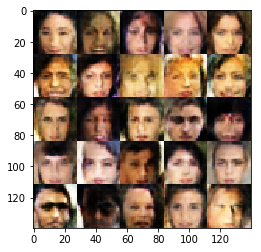

Epoch 1/1 Step 5200... Discriminator Loss: 0.8370... Generator Loss: 1.3185


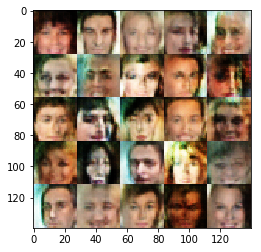

Epoch 1/1 Step 5300... Discriminator Loss: 1.0145... Generator Loss: 1.0125


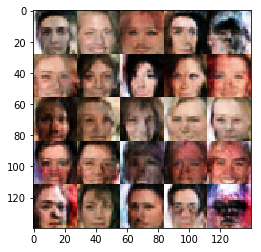

Epoch 1/1 Step 5400... Discriminator Loss: 1.3181... Generator Loss: 0.5777


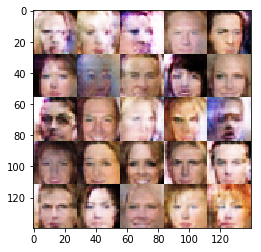

Epoch 1/1 Step 5500... Discriminator Loss: 1.1797... Generator Loss: 0.8410


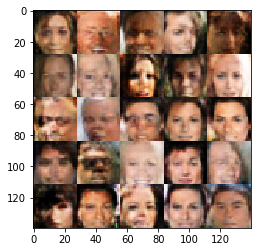

Epoch 1/1 Step 5600... Discriminator Loss: 1.1854... Generator Loss: 1.0134


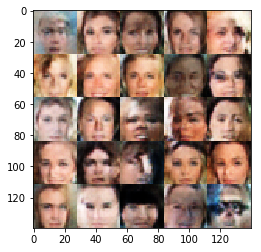

Epoch 1/1 Step 5700... Discriminator Loss: 1.1186... Generator Loss: 0.9748


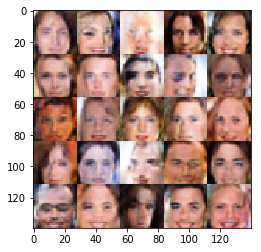

Epoch 1/1 Step 5800... Discriminator Loss: 1.1726... Generator Loss: 0.7822


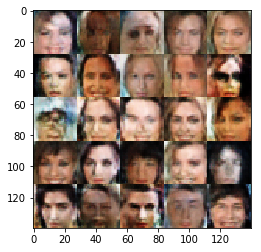

Epoch 1/1 Step 5900... Discriminator Loss: 1.0223... Generator Loss: 1.0923


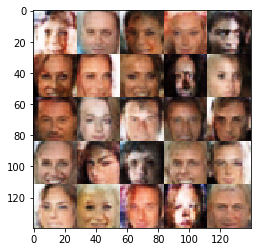

Epoch 1/1 Step 6000... Discriminator Loss: 1.2055... Generator Loss: 0.7907


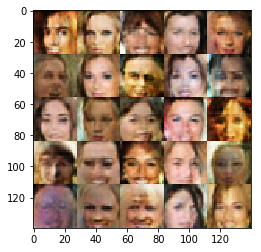

Epoch 1/1 Step 6100... Discriminator Loss: 1.1463... Generator Loss: 0.7201


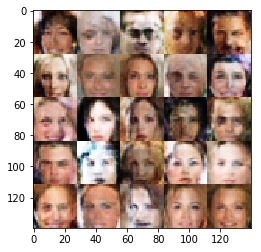

Epoch 1/1 Step 6200... Discriminator Loss: 1.1477... Generator Loss: 0.9258


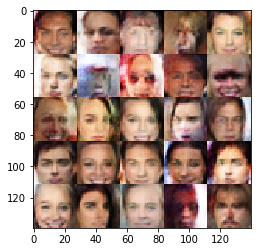

Epoch 1/1 Step 6300... Discriminator Loss: 1.2080... Generator Loss: 0.8134


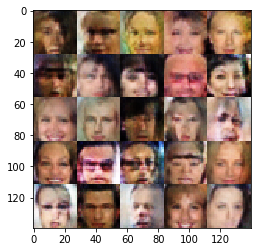

Epoch 1/1 Step 6400... Discriminator Loss: 1.1220... Generator Loss: 0.8652


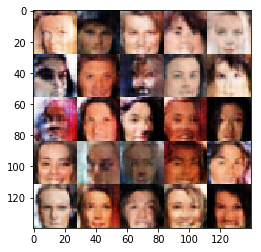

Epoch 1/1 Step 6500... Discriminator Loss: 1.1302... Generator Loss: 0.7052


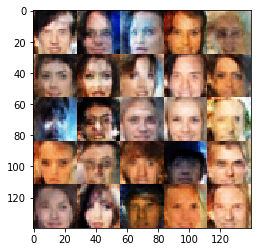

Epoch 1/1 Step 6600... Discriminator Loss: 0.9883... Generator Loss: 1.0978


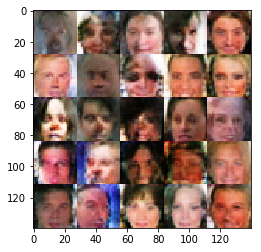

Epoch 1/1 Step 6700... Discriminator Loss: 1.2926... Generator Loss: 0.7421


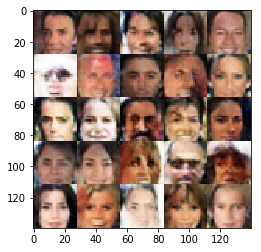

Epoch 1/1 Step 6800... Discriminator Loss: 1.2057... Generator Loss: 0.7000


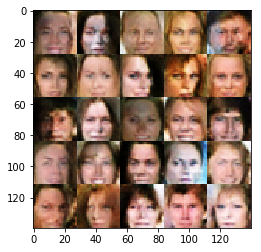

Epoch 1/1 Step 6900... Discriminator Loss: 0.9218... Generator Loss: 1.0868


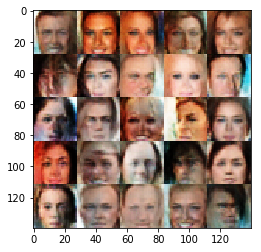

Epoch 1/1 Step 7000... Discriminator Loss: 1.4027... Generator Loss: 0.6002


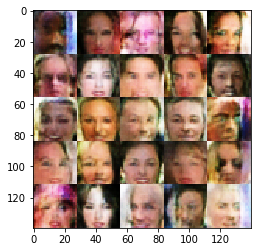

Epoch 1/1 Step 7100... Discriminator Loss: 0.9892... Generator Loss: 0.8924


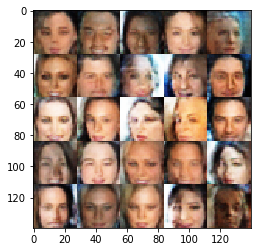

Epoch 1/1 Step 7200... Discriminator Loss: 1.1887... Generator Loss: 0.8996


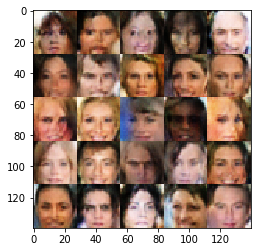

Epoch 1/1 Step 7300... Discriminator Loss: 1.3316... Generator Loss: 0.6062


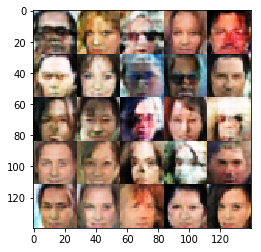

Epoch 1/1 Step 7400... Discriminator Loss: 1.1637... Generator Loss: 0.7230


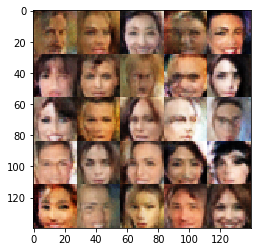

Epoch 1/1 Step 7500... Discriminator Loss: 1.6397... Generator Loss: 0.4334


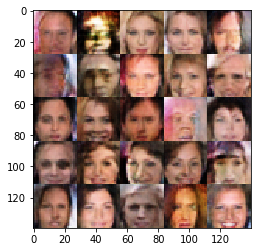

Epoch 1/1 Step 7600... Discriminator Loss: 1.6257... Generator Loss: 0.5036


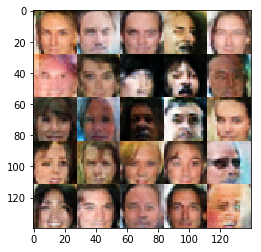

Epoch 1/1 Step 7700... Discriminator Loss: 1.4414... Generator Loss: 0.5939


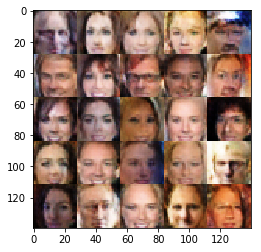

Epoch 1/1 Step 7800... Discriminator Loss: 1.2551... Generator Loss: 0.7684


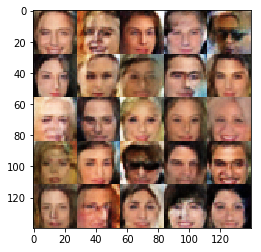

Epoch 1/1 Step 7900... Discriminator Loss: 1.2048... Generator Loss: 0.6856


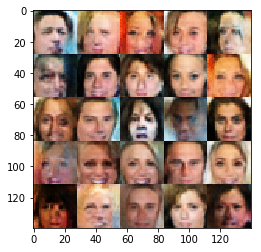

Epoch 1/1 Step 8000... Discriminator Loss: 1.1896... Generator Loss: 0.6775


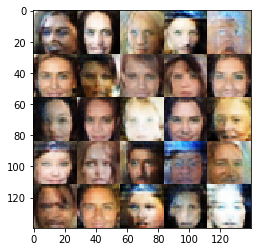

Epoch 1/1 Step 8100... Discriminator Loss: 1.4452... Generator Loss: 0.6953


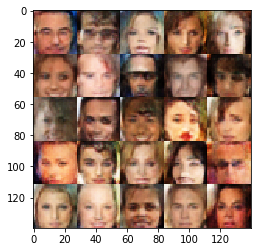

Epoch 1/1 Step 8200... Discriminator Loss: 1.1646... Generator Loss: 0.9783


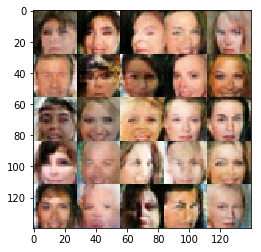

Epoch 1/1 Step 8300... Discriminator Loss: 1.1129... Generator Loss: 0.7267


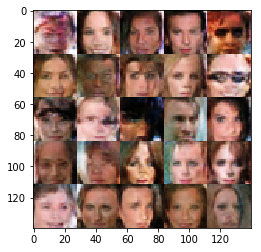

Epoch 1/1 Step 8400... Discriminator Loss: 1.1096... Generator Loss: 0.8237


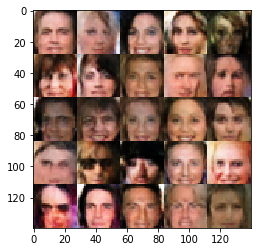

Epoch 1/1 Step 8500... Discriminator Loss: 1.3539... Generator Loss: 0.6820


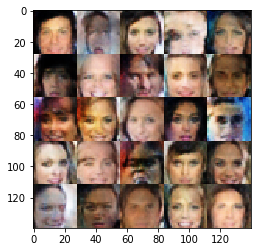

Epoch 1/1 Step 8600... Discriminator Loss: 1.4685... Generator Loss: 0.5333


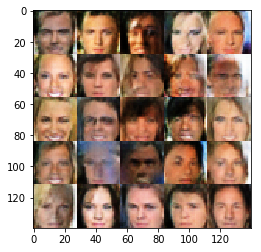

Epoch 1/1 Step 8700... Discriminator Loss: 1.3601... Generator Loss: 0.6596


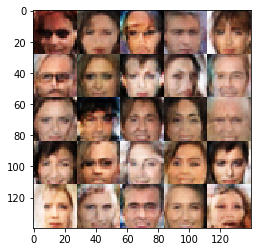

Epoch 1/1 Step 8800... Discriminator Loss: 1.4600... Generator Loss: 0.7573


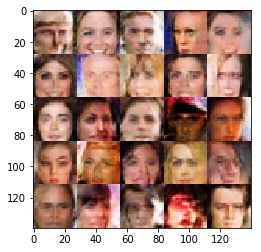

Epoch 1/1 Step 8900... Discriminator Loss: 0.9558... Generator Loss: 1.1763


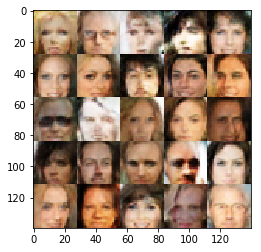

Epoch 1/1 Step 9000... Discriminator Loss: 1.2558... Generator Loss: 0.6360


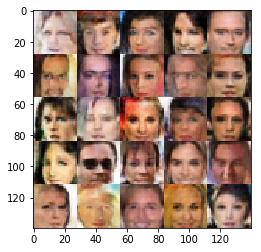

Epoch 1/1 Step 9100... Discriminator Loss: 1.3770... Generator Loss: 0.5604


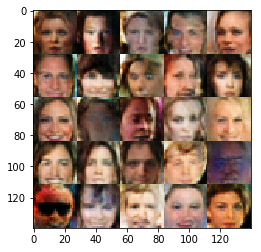

Epoch 1/1 Step 9200... Discriminator Loss: 1.3336... Generator Loss: 0.6157


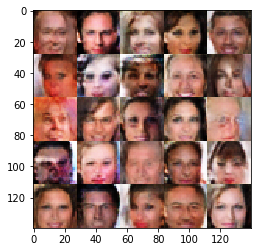

Epoch 1/1 Step 9300... Discriminator Loss: 1.3477... Generator Loss: 0.5753


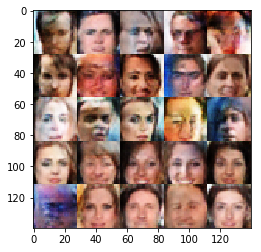

Epoch 1/1 Step 9400... Discriminator Loss: 1.3708... Generator Loss: 0.6414


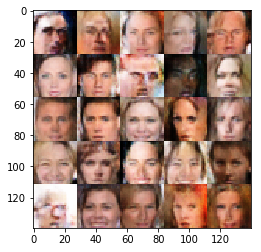

Epoch 1/1 Step 9500... Discriminator Loss: 1.0057... Generator Loss: 1.2611


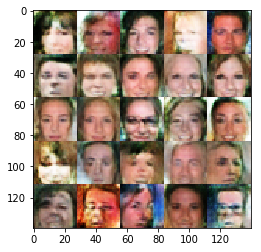

Epoch 1/1 Step 9600... Discriminator Loss: 1.2165... Generator Loss: 0.7103


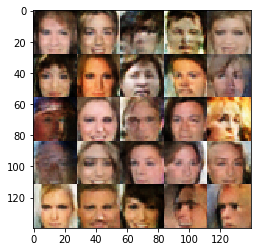

Epoch 1/1 Step 9700... Discriminator Loss: 1.0922... Generator Loss: 0.8203


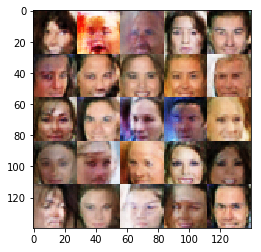

Epoch 1/1 Step 9800... Discriminator Loss: 1.0586... Generator Loss: 1.1663


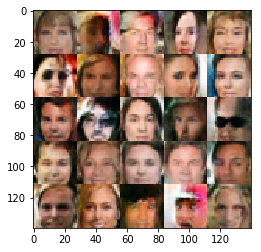

Epoch 1/1 Step 9900... Discriminator Loss: 1.3005... Generator Loss: 0.6906


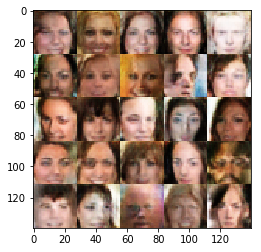

Epoch 1/1 Step 10000... Discriminator Loss: 1.1562... Generator Loss: 0.8411


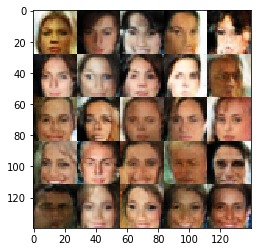

Epoch 1/1 Step 10100... Discriminator Loss: 1.1427... Generator Loss: 0.7443


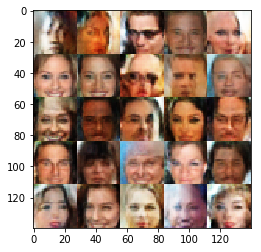

Epoch 1/1 Step 10200... Discriminator Loss: 1.4179... Generator Loss: 0.7185


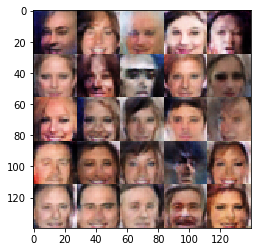

Epoch 1/1 Step 10300... Discriminator Loss: 1.0377... Generator Loss: 1.0016


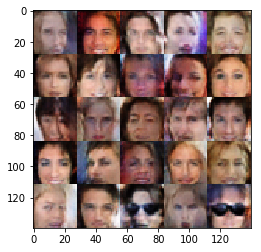

Epoch 1/1 Step 10400... Discriminator Loss: 1.0590... Generator Loss: 0.9232


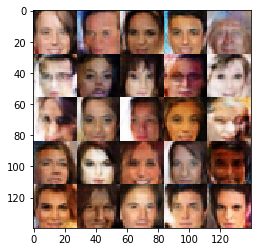

Epoch 1/1 Step 10500... Discriminator Loss: 1.2716... Generator Loss: 0.6397


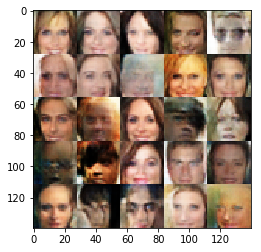

Epoch 1/1 Step 10600... Discriminator Loss: 1.3055... Generator Loss: 0.6345


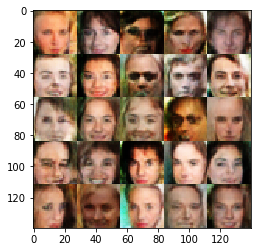

Epoch 1/1 Step 10700... Discriminator Loss: 0.9338... Generator Loss: 0.9742


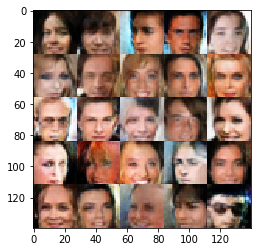

Epoch 1/1 Step 10800... Discriminator Loss: 1.0523... Generator Loss: 1.0372


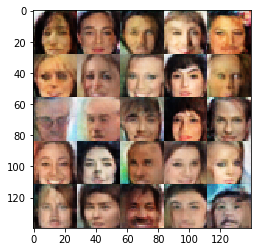

Epoch 1/1 Step 10900... Discriminator Loss: 1.4198... Generator Loss: 0.6876


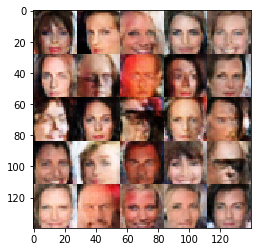

Epoch 1/1 Step 11000... Discriminator Loss: 1.2417... Generator Loss: 0.7461


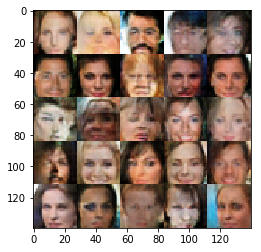

Epoch 1/1 Step 11100... Discriminator Loss: 1.3355... Generator Loss: 0.6038


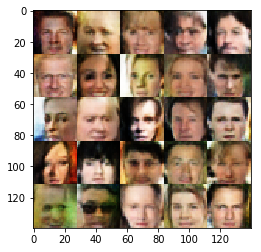

Epoch 1/1 Step 11200... Discriminator Loss: 1.1508... Generator Loss: 0.8357


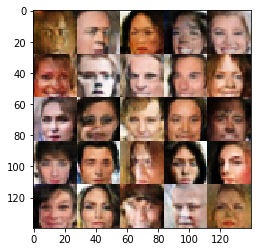

Epoch 1/1 Step 11300... Discriminator Loss: 1.1174... Generator Loss: 0.9681


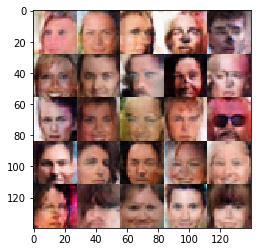

Epoch 1/1 Step 11400... Discriminator Loss: 1.1569... Generator Loss: 0.7272


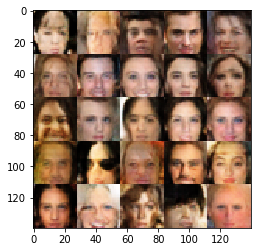

Epoch 1/1 Step 11500... Discriminator Loss: 1.2520... Generator Loss: 0.6425


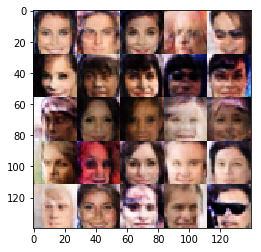

Epoch 1/1 Step 11600... Discriminator Loss: 1.2808... Generator Loss: 0.7641


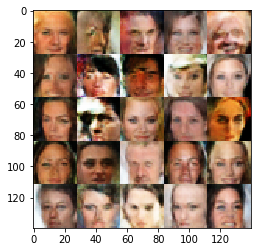

Epoch 1/1 Step 11700... Discriminator Loss: 1.3909... Generator Loss: 0.5426


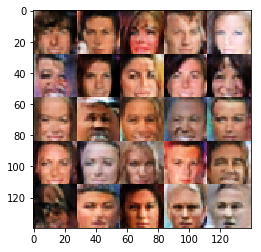

Epoch 1/1 Step 11800... Discriminator Loss: 1.4161... Generator Loss: 0.7523


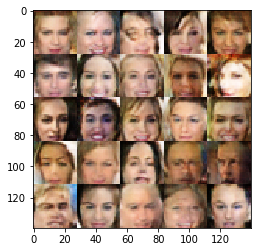

Epoch 1/1 Step 11900... Discriminator Loss: 0.8217... Generator Loss: 1.4282


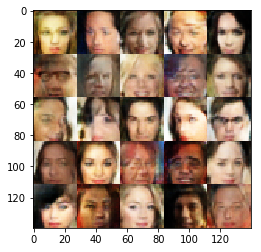

Epoch 1/1 Step 12000... Discriminator Loss: 1.1093... Generator Loss: 0.8976


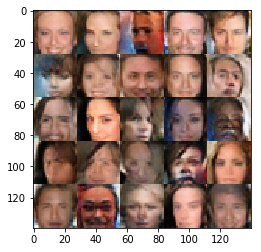

Epoch 1/1 Step 12100... Discriminator Loss: 1.1785... Generator Loss: 1.2486


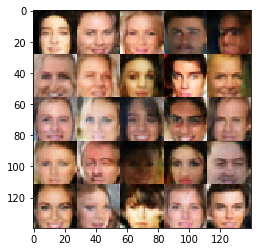

Epoch 1/1 Step 12200... Discriminator Loss: 1.2400... Generator Loss: 0.6458


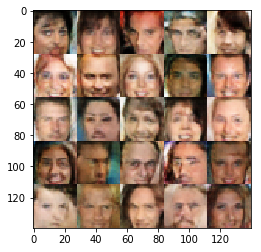

Epoch 1/1 Step 12300... Discriminator Loss: 1.4259... Generator Loss: 0.4820


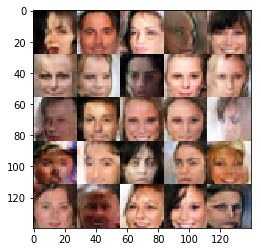

Epoch 1/1 Step 12400... Discriminator Loss: 1.4652... Generator Loss: 0.6271


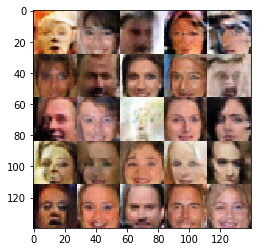

Epoch 1/1 Step 12500... Discriminator Loss: 1.0751... Generator Loss: 0.9554


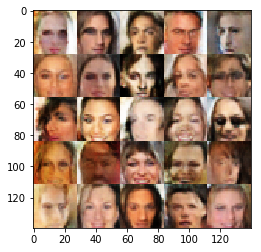

Epoch 1/1 Step 12600... Discriminator Loss: 0.8656... Generator Loss: 1.2007


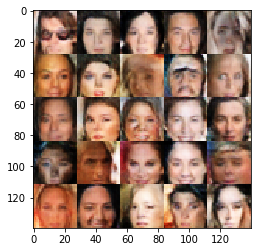

In [41]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。